Jeremy Marino - Chicago Resources Analysis

This is a GIS notebook to show some of the basic correlations between Chicago communities and resources in said communities. The goal to see if particular resources/lack of resources may correlate with an area's crime rate, poverty rate, etc.

This is an exercise to develop data analysis/cleaning, machine learning, and GIS skills, along with a case study on urban communities in America.

GeoDataSet Zip Files: https://geodatasets.readthedocs.io/en/latest/introduction.html

Chicago Community Area Population Dataset Documentation: https://geodacenter.github.io/data-and-lab//commpop/

Chicago Health Dataset Documentation: https://geodacenter.github.io/data-and-lab//comarea_vars/


In [30]:
import geopandas as gpd
import pandas as pd
import geodatasets
import warnings
from shapely.geometry import Point
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

warnings.filterwarnings('ignore', category=FutureWarning, module='pandas')
chicago = geopandas.read_file(geodatasets.get_path('geoda.chicago_commpop'))
chicago.head()

,community,NID,POP2010,POP2000,POPCH,POPPERCH,popplus,popneg,geometry
0,DOUGLAS,35,18238,26470,-8232,-31.099358,0,1,"MULTIPOLYGON (((-87.60914 41.84469, -87.60915 ..."
1,OAKLAND,36,5918,6110,-192,-3.142390,0,1,"MULTIPOLYGON (((-87.59215 41.81693, -87.59231 ..."
2,FULLER PARK,37,2876,3420,-544,-15.906433,0,1,"MULTIPOLYGON (((-87.6288 41.80189, -87.62879 4..."
3,GRAND BOULEVARD,38,21929,28006,-6077,-21.698922,0,1,"MULTIPOLYGON (((-87.60671 41.81681, -87.6067 4..."
4,KENWOOD,39,17841,18363,-522,-2.842673,0,1,"MULTIPOLYGON (((-87.59215 41.81693, -87.59215 ..."


In [8]:
chicago_liquor = geopandas.read_file(geodatasets.get_path('geoda.liquor_stores'))
chicago_liquor.head()

,id,placeid,geometry
0,0,ChIJnyLZdBTSD4gRbsa_hRGgPtc,MULTIPOINT (1161395.91 1928443.285)
1,3,ChIJ5Vdx0AssDogRVjbNIyF3Mr4,MULTIPOINT (1178227.792 1881864.522)
2,4,ChIJb5I6QwYsDogRe8R4E9K8mkk,MULTIPOINT (1178151.911 1879212.002)
3,6,ChIJESl0mMfMD4gRy23-8soxKuw,MULTIPOINT (1141552.993 1910193.701)
4,7,ChIJg28YOdvMD4gRiV2lZcjSVyQ,MULTIPOINT (1144074.399 1910643.753)


In [10]:
liquor1 = chicago_liquor.copy()

# set CRS if not defined
liquor1 = liquor1.set_crs(epsg=3435, allow_override=True) 
# convert to lat/lon
liquor1 = liquor1.to_crs(epsg=4326)

# get new Xcoord and Ycoord
liquor1['Xcoord'] = liquor1['geometry'].apply(lambda mp: mp.geoms[0].x if mp.geom_type == 'MultiPoint' else None)
liquor1['Ycoord'] = liquor1['geometry'].apply(lambda mp: mp.geoms[0].y if mp.geom_type == 'MultiPoint' else None)

liquor1['geometry'] = [Point(xy) for xy in zip(liquor1['Xcoord'], liquor1['Ycoord'])]

liquor1.head()

,id,placeid,geometry,Xcoord,Ycoord
0,0,ChIJnyLZdBTSD4gRbsa_hRGgPtc,POINT (-87.68203 41.95933),-87.682029,41.959331
1,3,ChIJ5Vdx0AssDogRVjbNIyF3Mr4,POINT (-87.62157 41.83115),-87.621569,41.831149
2,4,ChIJb5I6QwYsDogRe8R4E9K8mkk,POINT (-87.62193 41.82387),-87.621928,41.823872
3,6,ChIJESl0mMfMD4gRy23-8soxKuw,POINT (-87.75543 41.90964),-87.755433,41.909643
4,7,ChIJg28YOdvMD4gRiV2lZcjSVyQ,POINT (-87.74616 41.91083),-87.746159,41.910831


In [12]:
# Get Chicago Groceries
groceries = geopandas.read_file(geodatasets.get_path('geoda.groceries'))
groceries.head()

,OBJECTID,Ycoord,Xcoord,Status,Address,Chain,Category,geometry
0,16,41.973266,-87.657073,OPEN,"1051 W ARGYLE ST, CHICAGO, IL. 60640",VIET HOA PLAZA,None,MULTIPOINT (1168268.672 1933554.35)
1,18,41.696367,-87.681315,OPEN,"10800 S WESTERN AVE, CHICAGO, IL. 60643-3226",COUNTY FAIR FOODS,None,MULTIPOINT (1162302.618 1832900.224)
2,22,41.868634,-87.638638,OPEN,"1101 S CANAL ST, CHICAGO, IL. 60607-4932",WHOLE FOODS MARKET,None,MULTIPOINT (1173317.042 1895425.426)
3,23,41.877590,-87.654953,OPEN,"1101 W JACKSON BLVD, CHICAGO, IL. 60607-2905",TARGET/SUPER,new,MULTIPOINT (1168996.475 1898801.406)
4,27,41.737696,-87.625795,OPEN,"112 W 87TH ST, CHICAGO, IL. 60620-1318",FOOD 4 LESS,None,MULTIPOINT (1176991.989 1847262.423)


In [14]:
# Pinpoint Grocery Locations
groceries1 = groceries.copy()
groceries1['geometry'] = [Point(xy) for xy in zip(groceries1['Xcoord'], groceries1['Ycoord'])]
groceries1.head()

,OBJECTID,Ycoord,Xcoord,Status,Address,Chain,Category,geometry
0,16,41.973266,-87.657073,OPEN,"1051 W ARGYLE ST, CHICAGO, IL. 60640",VIET HOA PLAZA,None,POINT (-87.657 41.973)
1,18,41.696367,-87.681315,OPEN,"10800 S WESTERN AVE, CHICAGO, IL. 60643-3226",COUNTY FAIR FOODS,None,POINT (-87.681 41.696)
2,22,41.868634,-87.638638,OPEN,"1101 S CANAL ST, CHICAGO, IL. 60607-4932",WHOLE FOODS MARKET,None,POINT (-87.639 41.869)
3,23,41.877590,-87.654953,OPEN,"1101 W JACKSON BLVD, CHICAGO, IL. 60607-2905",TARGET/SUPER,new,POINT (-87.655 41.878)
4,27,41.737696,-87.625795,OPEN,"112 W 87TH ST, CHICAGO, IL. 60620-1318",FOOD 4 LESS,None,POINT (-87.626 41.738)


<Axes: >

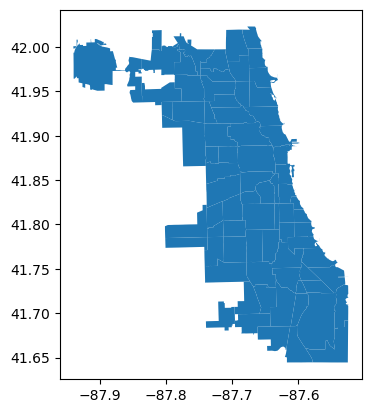

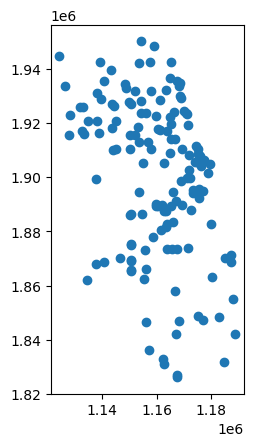

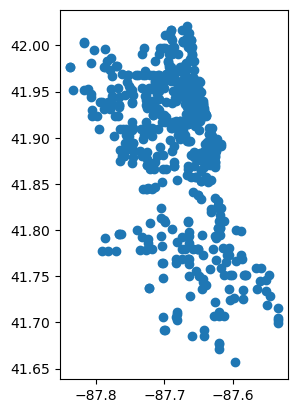

In [16]:
# Initial Chicago Plots
chicago.plot()
groceries.plot()
liquor1.plot()

<Axes: >

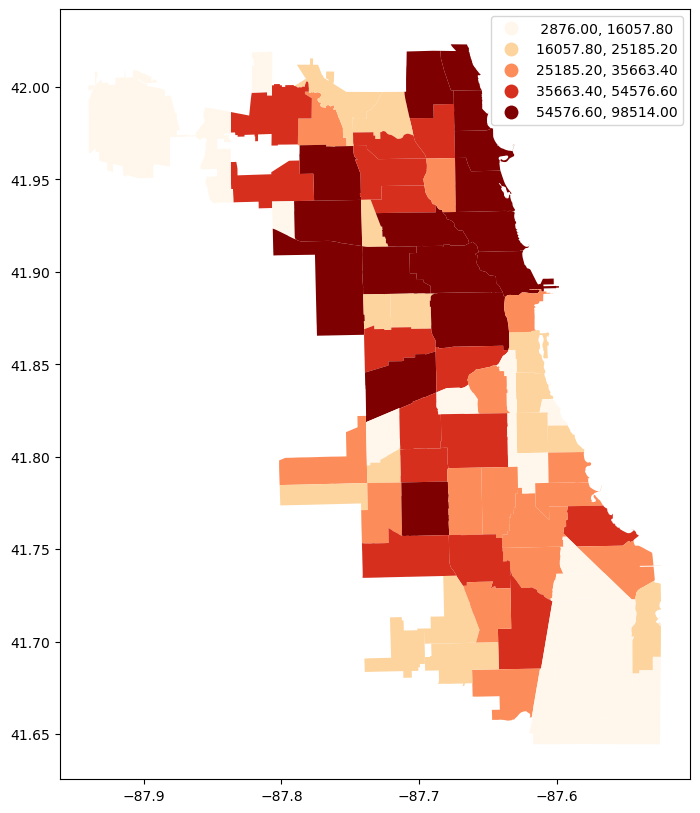

In [18]:
# Chicago Population Heat Map
chicago.plot(column= 'POP2010', legend=True, figsize=(30, 10), cmap='OrRd', 
             scheme = 'quantiles')

This heat map of Chicago shows where relative populations are in the city, along with which ones may be unrepresented.

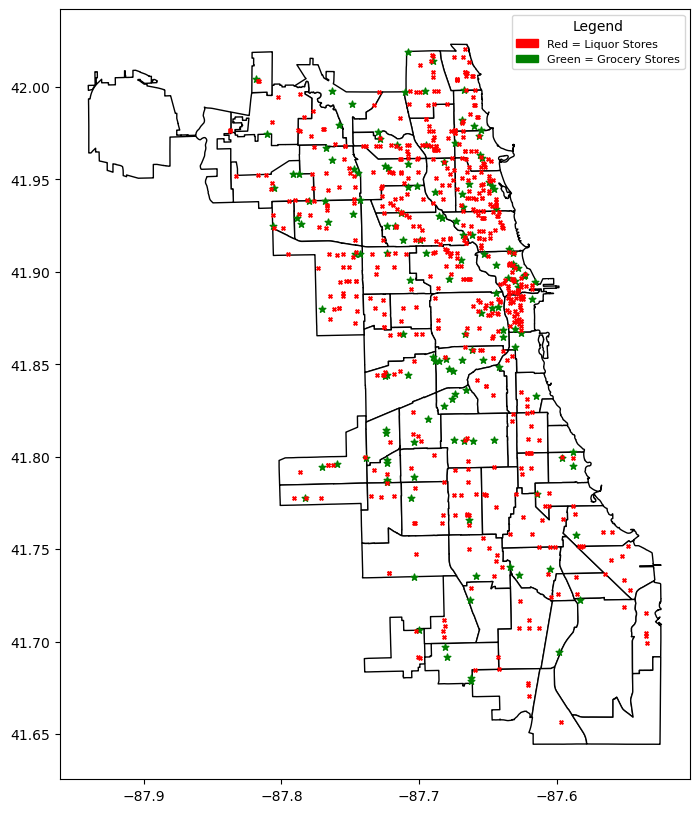

In [61]:
groceries = groceries.to_crs(chicago.crs)
base = chicago.plot(color = 'white', edgecolor = 'black', figsize=(30, 10))
groceries.plot(marker = '*', color='green', markersize = 25, ax = base)
liquor1.plot(marker = 'x', color='red', markersize = 7, ax = base)


red_patch = mpatches.Patch(color='red', label='Red = Liquor Stores')
green_patch = mpatches.Patch(color='green', label='Green = Grocery Stores')
plt.legend(handles=[red_patch, green_patch], title="Legend", loc='upper right', fontsize=8)
plt.show()

This visualization in particular telling, as many of the low-income/high crime areas such as the South Side have food deserts (i.e. a lack of grocery stores in a particular area) with a higher volume of liquor stores. This forces people of those areas to depend on fast food restaurants and corner stores to find food, and therefore lacking clean, nutritious food.

These droughts of accessible foods and surplus of liquor stores forces residents into cycles poor health and alcoholism of varying degrees. This could be a factor in the economic and criminal turmoil in the area along with the ability to develop families, safe environments, etc. 

In [20]:
chicago_health1 = geopandas.read_file(geodatasets.get_path('geoda.chicago_health'))
chicago_health1.head()

,ComAreaID,community,TRACTCnt,shape_area,shape_len,Pop2012,Pop2014,PopChng,PopM,PopMP,...,InfntMR,LungCancer,ProstateC,Stroke,ChlBLLS,ChlLeadP,GonorrF,GonorrM,Tuberc,geometry
0,35,DOUGLAS,10,4.600462e+07,31027.054510,18238,19430,3.1645,8294,42.6866,...,13.4,74.5,85.5,62.1,482.2,0,1063.3,727.4,4.2,"POLYGON ((-87.60914 41.84469, -87.60915 41.844..."
1,36,OAKLAND,3,1.691396e+07,19565.506153,5918,6473,4.4791,2499,38.6065,...,8.2,54.5,54.2,43.7,435.4,0,1655.4,1629.3,6.7,"POLYGON ((-87.59215 41.81693, -87.59231 41.816..."
2,37,FULLER PARK,2,1.991670e+07,25339.089750,2876,2543,-6.1450,1218,47.8962,...,22.6,89.6,70.5,82.4,489.9,2,1061.9,1556.4,0.0,"POLYGON ((-87.6288 41.80189, -87.62879 41.8017..."
3,38,GRAND BOULEVARD,14,4.849250e+07,28196.837157,21929,22531,1.3540,9681,42.9675,...,12.1,63.8,39.0,46.7,590.4,1,1454.6,1680.0,13.2,"POLYGON ((-87.60671 41.81681, -87.6067 41.8165..."
4,39,KENWOOD,7,2.907174e+07,23325.167906,17841,18217,1.0428,8543,46.8958,...,8.9,49.1,46.2,31.5,397.9,0,610.2,549.1,0.0,"POLYGON ((-87.59215 41.81693, -87.59215 41.816..."


In [22]:
chicago_health = geopandas.read_file(geodatasets.get_path('geoda.chicago_health'))

chicago_health = chicago_health.to_crs(epsg=4326)

chicago_geojson = chicago_health.__geo_interface__

chicago_health['PovertyRate'] = chicago_health['Pov14'] / chicago_health['Pop2014']

In [32]:
groceries_gdf = gpd.GeoDataFrame(
    groceries1,
    geometry=gpd.points_from_xy(groceries1["Xcoord"], groceries1["Ycoord"]),
    crs="EPSG:4326"
)

liquor_gdf = gpd.GeoDataFrame(
    liquor1,
    geometry=gpd.points_from_xy(liquor1["Xcoord"], liquor1["Ycoord"]),
    crs="EPSG:4326"
)

groceries_gdf = groceries_gdf.to_crs(chicago_health.crs)
liquor_gdf = liquor_gdf.to_crs(chicago_health.crs)

groceries_in_community = gpd.sjoin(groceries_gdf, chicago_health, how="inner", predicate="within")
liquor_in_community = gpd.sjoin(liquor_gdf, chicago_health, how="inner", predicate="within")

grocery_counts = groceries_in_community["community"].value_counts().rename("GroceryStoreCount")
liquor_counts = liquor_in_community["community"].value_counts().rename("LiquorStoreCount")

chicago_health = chicago_health.set_index("community")
chicago_health = chicago_health.join(grocery_counts).join(liquor_counts)
chicago_health = chicago_health.fillna(0)

Creating the new aggregate features above will help given context to each community's demographics and food situations on future visualizations and analysis via machine learning models.

In [34]:
chicago_health['WhitePercentage'] = np.round(chicago_health['Wht14'] / chicago_health['Pop2014'], 3)
chicago_health['BlackPercentage'] = np.round(chicago_health['Blk14'] / chicago_health['Pop2014'], 3)
chicago_health['HispanicPercentage'] = np.round(chicago_health['Hisp14'] / chicago_health['Pop2014'], 3)
chicago_health['AsianPercentage'] = np.round(chicago_health['AS14'] / chicago_health['Pop2014'], 3)
chicago_health['IndianPercentage'] = np.round(chicago_health['AI14'] / chicago_health['Pop2014'], 3)

chicago_health = chicago_health.reset_index()
chicago_health.head()

,community,ComAreaID,TRACTCnt,shape_area,shape_len,Pop2012,Pop2014,PopChng,PopM,PopMP,...,Tuberc,geometry,PovertyRate,GroceryStoreCount,LiquorStoreCount,WhitePercentage,BlackPercentage,HispanicPercentage,AsianPercentage,IndianPercentage
0,DOUGLAS,35,10,4.600462e+07,31027.054510,18238,19430,3.1645,8294,42.6866,...,4.2,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",0.320587,1.0,5.0,0.142,0.721,0.022,0.138,0.004
1,OAKLAND,36,3,1.691396e+07,19565.506153,5918,6473,4.4791,2499,38.6065,...,6.7,"POLYGON ((-87.59215 41.81693, -87.59231 41.816...",0.386220,0.0,0.0,0.036,0.938,0.019,0.022,0.001
2,FULLER PARK,37,2,1.991670e+07,25339.089750,2876,2543,-6.1450,1218,47.8962,...,0.0,"POLYGON ((-87.6288 41.80189, -87.62879 41.8017...",0.364530,0.0,2.0,0.048,0.909,0.075,0.000,0.000
3,GRAND BOULEVARD,38,14,4.849250e+07,28196.837157,21929,22531,1.3540,9681,42.9675,...,13.2,"POLYGON ((-87.60671 41.81681, -87.6067 41.8165...",0.336780,0.0,5.0,0.047,0.939,0.021,0.006,0.007
4,KENWOOD,39,7,2.907174e+07,23325.167906,17841,18217,1.0428,8543,46.8958,...,0.0,"POLYGON ((-87.59215 41.81693, -87.59215 41.816...",0.232310,0.0,0.0,0.210,0.700,0.038,0.091,0.007


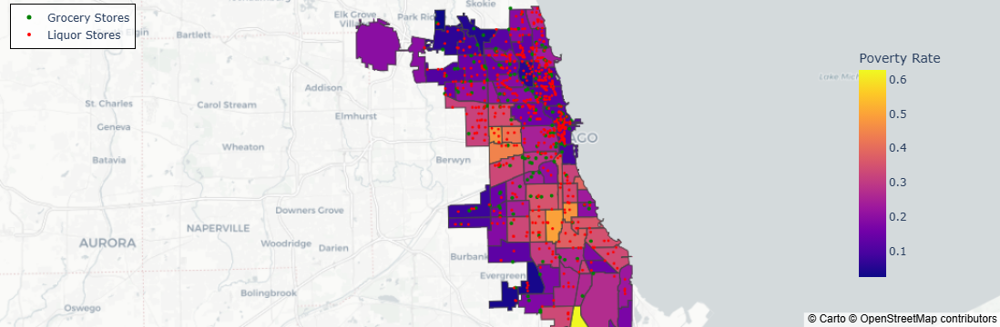

In [191]:
fig = px.choropleth_mapbox(
    chicago_health,
    geojson=chicago_geojson,
    locations=chicago_health.index,
    color='PovertyRate',
    mapbox_style="carto-positron",
    center={"lat": 41.8781, "lon": -87.6298},
    zoom=9,
    hover_name="community",
    hover_data=["Pop2014", "WhitePercentage", "BlackPercentage", 
                "HispanicPercentage", "AsianPercentage", "IndianPercentage",
                "GroceryStoreCount", "LiquorStoreCount"] 
)

fig.add_trace(go.Scattermapbox(
    lat=groceries1['Ycoord'],
    lon=groceries1['Xcoord'],
    mode='markers',
    hoverinfo='skip',
    marker=go.scattermapbox.Marker(
        size=5,
        color='green'
    ),
    name='Grocery Stores', 
    showlegend=True
))

fig.add_trace(go.Scattermapbox(
    lat=liquor1['Ycoord'],
    lon=liquor1['Xcoord'],
    mode='markers',
    hoverinfo='skip',
    marker=go.scattermapbox.Marker(
        size=4,
        color='red'
    ),
    name='Liquor Stores',
    showlegend=True
))

fig.update_layout(
    legend=dict(
        x=0.01,
        y=0.99,
        bgcolor="rgba(255,255,255,0.7)",
        bordercolor="black",
        borderwidth=1
    ),
    coloraxis_colorbar=dict(
        x=0.85,
        len=0.75,
        title="Poverty Rate"
    )
)

fig.update_layout(margin={"r":0, "t":0, "l":0, "b":0})
fig.show()
fig.write_html("C:/Users/Jerem/Juypter Notebook/chicago_map.html")

In [38]:
# p(GroceryStoreCount <= 0/1 | PovertyRate > 20%) = p(GroceryStoreCount <= 0/1 and PovertyRate > 20%) / p(PovertyRate > 20%)
# p(LiquorStoreCount > 1 | GroceryStoreCount = 0) = p(LiquorStoreCount > 1 and GroceryStoreCount = 0) / p(GroceryStoreCount = 0)
chicago_health['has_1_grocery'] = chicago_health['GroceryStoreCount'] > 0
chicago_health['has_multiple_grocery'] = chicago_health['GroceryStoreCount'] > 1
chicago_health['has_multiple_liquor'] = chicago_health['LiquorStoreCount'] > 1

poverty_over_20 = chicago_health[chicago_health['PovertyRate'] >= .20]
no_grocery_stores = chicago_health[chicago_health['GroceryStoreCount'] == 0]

p_zero_grocery_given_poverty = 1 - (poverty_over_20['has_1_grocery'].mean())
p_one_or_zero_grocery_given_poverty = 1 - (poverty_over_20['has_multiple_grocery'].mean())
p_multi_liquor_given_no_grocery = (no_grocery_stores['has_multiple_liquor'].mean())

print('p(GroceryStoreCount = 0 | PovertyRate > 20%) = ', np.round(p_zero_grocery_given_poverty, 3))
print('p(GroceryStoreCount <= 1 | PovertyRate > 20%) = ', np.round(p_one_or_zero_grocery_given_poverty, 3))
print('p(LiquorStoreCount > 1 | GroceryStoreCount = 0) = ', np.round(p_multi_liquor_given_no_grocery, 3))

p(GroceryStoreCount = 0 | PovertyRate > 20%) =  0.425
p(GroceryStoreCount <= 1 | PovertyRate > 20%) =  0.725
p(LiquorStoreCount > 1 | GroceryStoreCount = 0) =  0.708


To expand on these implications, creating some aggregate features such as racial demographics and the poverty rate will give an insight into who is most affected by food deserts.

Scanning this map, it is clear the more impoverish communities (predominately on the South Side) have a much larger ratio of liquor stores to grocery stores than the richer parts of Chicago. These communities are disproportionally black/Hispanic and the distance to grocery stores appears to correlate with poverty (and presumably health status).

Above is the conditional probability given a community's poverty rate is greater than 20% (America's poverty rate at the time was 14.8%) that they have no grocery stores, at 42.5%, or less than one grocery store, at 72.5%, in their communities respectively. This corresponds with the probability a community has multiple liquor stores given it has not grocery stores, at 70.8%.

As seen in the rates above, it supports the claim that impoverish communities have little access to healthy food options as stated before, and that the abundance of corner markets such as liquor stores take precedent in many community's diets. 

Lets dig deeper into to what actually correlates to a larger poverty rate within Chicago communities using Lasso Ridge Regression.

The goal is to use this model to find the most important external features and filter ones that may cause bias or skewing of results.

In [411]:
# find initial correlation to PovertyRate feature
correlations = chicago_health.corr(numeric_only=True)['PovertyRate'].sort_values(ascending=False)
correlations = pd.DataFrame(correlations)
correlations.columns = ['Correlation to PovertyRate']
correlations

,Correlation to PovertyRate
PovertyRate,1.000000
field_37,0.998050
Pov125P,0.986910
Pov150P,0.971986
Pov185P,0.940303
Pov200P,0.921074
Pov50P,0.879055
VlntCrRt,0.827263
HISave,0.809403
GonorrF,0.767459


Below is the removal of irrelevant, repeated data, and non-proportional values where possible that would take away from the important findings of the model (for example, obviously the number of people with income below 50% of the poverty rate is correlated with the aggregate poverty rate, and would drown out interesting correlations).

In [202]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler

In [408]:
chicago_health_features = ['PopMP',
       'PopFP', 'Under5P', 'Under18P',
       'Over18P', 'Over21P', 'Over65P', 'Wht14P',
       'Blk14P', 'AI14P', 'AS14P', 'NHP14P',
       'Oth14P', 'Hisp14P', 'PropCrRt',
       'VlntCrRt', 'PPop14',
       'ChldPov14', 'NoHS14', 'HSGrad14', 'SmClg14', 'ClgGrad14', 'LaborFrc',
       'Unemp14', 'COIave',
       'Hlitave', 'BirthRate', 'FertRate', 'LoBirthR', 'PrenScrn', 'PretBrth',
       'TeenBirth', 'Assault', 'BrstCancr', 'CancerAll', 'Colorect', 'DiabetM',
       'FirearmM', 'InfntMR', 'LungCancer', 'ProstateC', 'Stroke', 'ChlBLLS',
       'ChlLeadP', 'GonorrF', 'GonorrM', 'Tuberc',
       'GroceryStoreCount', 'LiquorStoreCount']

poverty_rate = chicago_health['PovertyRate']
chicago_health[chicago_health_features]

,PopMP,PopFP,Under5P,Under18P,Over18P,Over21P,Over65P,Wht14P,Blk14P,AI14P,...,LungCancer,ProstateC,Stroke,ChlBLLS,ChlLeadP,GonorrF,GonorrM,Tuberc,GroceryStoreCount,LiquorStoreCount
0,42.6866,57.3134,9.7169,14.9460,85.0540,77.3700,14.5857,14.1637,72.0793,0.4426,...,74.5,85.5,62.1,482.2,0,1063.3,727.4,4.2,1.0,5.0
1,38.6065,61.3935,11.2004,29.9397,70.0603,65.0857,9.2847,3.6150,93.8050,0.0927,...,54.5,54.2,43.7,435.4,0,1655.4,1629.3,6.7,0.0,0.0
2,47.8962,52.1038,20.8808,23.2009,76.7991,73.5352,21.3134,4.7975,90.8769,0.0000,...,89.6,70.5,82.4,489.9,2,1061.9,1556.4,0.0,0.0,2.0
3,42.9675,57.0325,11.1180,25.1165,74.8835,70.1034,12.9333,4.6602,93.8707,0.6924,...,63.8,39.0,46.7,590.4,1,1454.6,1680.0,13.2,0.0,5.0
4,46.8958,53.1042,6.5378,19.4159,80.5841,77.7900,15.3209,21.0463,70.0115,0.7081,...,49.1,46.2,31.5,397.9,0,610.2,549.1,0.0,0.0,0.0
5,49.9659,50.0341,7.1788,16.7143,83.2857,81.4120,9.2548,78.9162,4.5010,0.9761,...,43.1,27.6,36.9,273.3,0,98.8,195.5,8.5,2.0,21.0
6,41.6416,58.3584,12.7587,37.4946,62.5054,58.4356,7.8561,1.9576,97.8106,1.3480,...,79.8,67.0,43.3,502.4,0,2145.8,2058.0,5.0,0.0,5.0
7,48.4591,51.5409,6.3284,13.9562,86.0438,74.1135,12.2224,51.7544,34.1135,0.6591,...,34.9,24.1,26.0,369.0,0,216.6,168.4,5.3,3.0,2.0
8,44.5759,55.4241,7.2846,26.3958,73.6042,65.9188,10.7461,10.1607,87.0693,0.6562,...,69.8,58.0,60.0,444.3,1,1382.0,1818.6,17.4,1.0,5.0
9,49.6049,50.3951,6.5410,18.6747,81.3253,75.3401,8.4954,60.6216,28.8086,1.0136,...,36.7,21.7,33.7,364.7,0,322.5,423.3,11.4,1.0,16.0


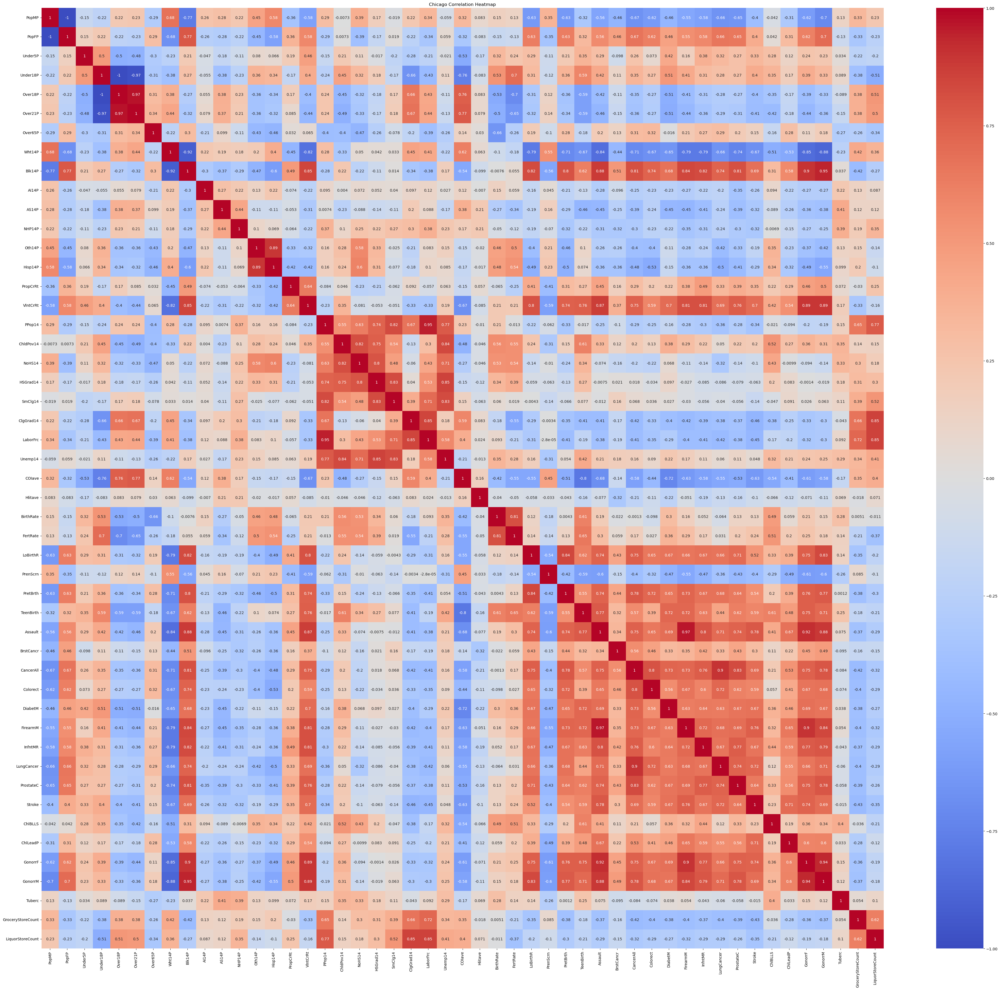

In [417]:
corr_matrix = chicago_health[chicago_health_features].corr()

plt.figure(figsize=(50, 45))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Chicago Correlation Heatmap')
plt.show()
#plt.savefig("your_path_here", dpi=300)

Above is a correlation matrix that shows how features relate to one another (if hard to read, try downloading it as a png using the commented-out code to zoom in and edit where needed).

Here are some interesting findings:

- The correlation between the black population and negative health conditions is very high (the relationship between gonorrhea and the black male/female populations, in particular, is shocking at a combined 93% correlation rate)
- The correlation between health issues in the black vs the white population seems to have an inverse relationship, as all negative conditions (gonorrhea, stroke, lung cancer, etc) positively correlate strongly with the black population and negatively correlate strongly with the white population. The opposite is true for the correlation between each population and prenatal care beginning in the first trimester.
- A child in poverty has a very strong correlation with not going to high school and higher education
- The white population has a positive correlation to both grocery and liquor store counts, while the black population has a negative correlation.

Next, lets preprocess the filtered data and build out the model to see if the results validate the prior findings.

In [422]:
# make test_train split and scale
[X_train, X_test, y_train, y_test] = train_test_split(chicago_health[chicago_health_features], poverty_rate, test_size=0.2)

scaler = StandardScaler()
data_scaled = scaler.fit_transform(chicago_health[chicago_health_features])
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

y_train = y_train.to_numpy().reshape(-1, 1)
y_test = y_test.to_numpy().reshape(-1, 1)

(X_train_scaled.shape, X_test_scaled.shape, y_train.shape, y_test.shape)

((61, 49), (16, 49), (61, 1), (16, 1))

In [390]:
# make copies and add bias
X1, X1_test = X_train_scaled.copy(), X_test_scaled.copy()
y1, y1_test = y_train.copy(), y_test.copy()

X1 = np.hstack([np.ones((X1.shape[0], 1)), X1])
X1_test = np.hstack([np.ones((X1_test.shape[0], 1)), X1_test])


In [392]:
# set regression constraints
n_features = X1.shape[1]
n = X1.shape[0]
lam = 0.1
nu = 0.01
iterations = 10000
result = []
w = np.ones((n_features, 1))
(X1.shape, y1.shape, w.shape)

((61, 50), (61, 1), (50, 1))

In [394]:
# run lasso regression
def f_lasso_c(X, y, w, lam):
    return ((1 / n) * (np.dot(X, w) - y) ** 2 + lam * np.linalg.norm(w[:-1], ord=1))

def fp_lasso_c(X, y, w, lam):
    grad = (2 / n) * np.dot(X.T, (np.dot(X, w) - y))
    lasso = lam * np.sign(w)
    return grad + lasso

def lin_reg(X, y, w, nu, lam, iterations):
    for i in range(iterations):
        w = w - nu * fp_lasso_c(X, y, w, lam)
        result.append(f_lasso_c(X, y, w, lam))
    return w

w = lin_reg(X1, y1, w, nu, lam, iterations)


print("Best weights (w):\n", np.hstack(w))
result = np.vstack(result)

y_pred = np.dot(X1_test, w)
print(np.mean((y_test - y_pred)**2))

Best weights (w):
 [ 1.80935747e-01 -1.26720638e-03  1.26720638e-03  8.80839377e-04
 -1.12387849e-04  1.12387849e-04 -3.78752719e-04 -1.09495501e-03
  1.76129696e-05  1.06419466e-03 -2.55848724e-04  3.00676765e-04
  1.26965883e-04  6.05108779e-04 -1.27955815e-04  1.20756302e-03
  1.97025403e-02  7.66504869e-04  1.29919449e-03 -4.94654605e-04
  2.13731145e-04  3.78681965e-04  5.61590973e-04 -2.37017646e-04
  3.52489592e-05 -3.08575890e-02 -1.58256876e-04  7.31700283e-04
 -5.27704561e-05  1.21576730e-03 -1.37740788e-03  2.96459184e-05
  1.14599943e-03  3.69257784e-04  1.01295277e-03 -1.49107268e-04
  8.04186945e-04  1.36332038e-04  6.43834167e-04  3.03993960e-04
  6.74758558e-05  6.55753812e-05 -4.33331381e-05 -4.60785318e-05
  4.72803808e-04  4.38949100e-04 -1.57991700e-04  1.02819231e-03
 -2.85474678e-04  2.06284545e-04]
0.008866190450654707


In [396]:
(w[1:].flatten().shape, len(chicago_health_features))

((49,), 49)

In [481]:
feature_importance = pd.DataFrame({
    "Feature": chicago_health_features,  
    "Weight": w[1:].flatten()
})

#pd.set_option('display.max_rows', None)
pd.reset_option('display.max_columns')
increasing_poverty = feature_importance.sort_values(by="Weight", ascending=False)
print("Top features that increase poverty:")
increasing_poverty

Top features that increase poverty:


,Feature,Weight
15,VlntCrRt,0.019703
17,ChldPov14,0.001299
1,PopFP,0.001267
28,LoBirthR,0.001216
14,PropCrRt,0.001208
31,TeenBirth,0.001146
8,Blk14P,0.001064
46,Tuberc,0.001028
33,BrstCancr,0.001013
2,Under5P,0.000881


It appears many of the features commonly associated with poverty are the most relevant to the percentage of people below the poverty line (violent/property crime, birth rates/teen birth, lingering health issues, etc). These features are most associated with the black population and compound on each other making them concurrent when discussing socio-economic issues revolving poverty and race.

While none of these finding may come as a shock to the average American, it is vital that data is collected to find and diagnose larger issues such as this. While there is no simple solution to alleviating poverty and race inequality, arming people with insights into the world around them is necessary in developing answers to lingering societal problems such as this.

Considerations for this analysis:

- Data is via a self-reported 2014 survey based on Chicago demographics
- The sample-size (i.e. the 77 Chicago communities) is generally a small sample size for training a regression model
- Some data used seems inaccurate (for example, almost all per capita income statistics are in the 100k range, which is incorrect)

Expansion Plans:

- More data sets (interest in seeing how these findings relate to other communities/how accurate regression model is with exterior data)
- Expand to different cities (what other areas communities may be interesting to analyze in comparison to Chicago)
- New Machine Learning Models (get data insights and predictions)

In [431]:
import pandas as pd
import plotly.express as px

crime = pd.read_csv("C:/Users/Jerem/Documents/NU SPRING 2025/DS4200 INFO PRES/Geospartial-Py/us_statewide_crime.csv")
crime.head()

,State,Violent_Crime,Murder_Rate,Poverty,High_School,College,Single_Parent,Unemployed,Metropolitan
0,Alabama,486,7.4,14.7,77.5,20.4,26.0,4.6,70.2
1,Alaska,567,4.3,8.4,90.4,28.1,23.2,6.6,41.6
2,Arizona,532,7.0,13.5,85.1,24.6,23.5,3.9,87.9
3,Arkansas,445,6.3,15.8,81.7,18.4,24.7,4.4,49.0
4,California,622,6.1,14.0,81.2,27.5,21.8,4.9,96.7


In [433]:
state_abbreviations = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA',
    'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 'Florida': 'FL', 'Georgia': 'GA',
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA',
    'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
    'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS',
    'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA',
    'Rhode Island': 'RI', 'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN',
    'Texas': 'TX', 'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA',
    'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY', 'District of Columbia': 'DC'
}

# Create a new column with state abbreviations
crime['Code'] = crime['State'].map(state_abbreviations)

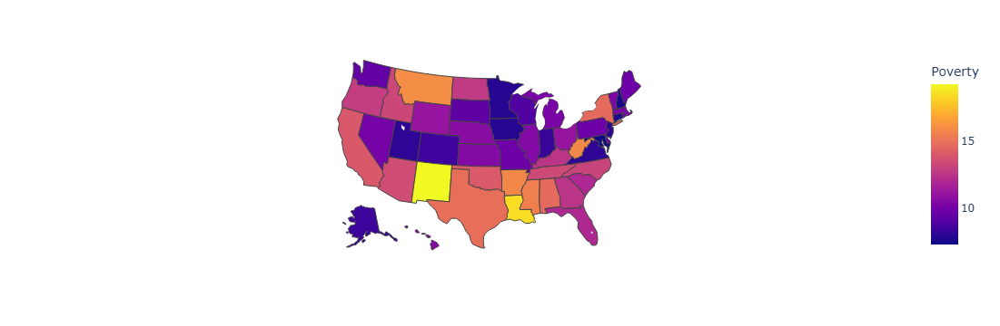

In [435]:
fig_america = px.choropleth(
    crime,
    locations = 'Code',
    locationmode = 'USA-states',
    color = 'Poverty',
    scope = 'usa',
    hover_name = 'State',
    hover_data = ['Violent_Crime', 'Murder_Rate']
)
fig_america

In [19]:
fig.write_html("C:/Users/Jerem/Downloads/quiz9.html")
